In [1]:
%matplotlib inline
import utils; reload(utils)
from utils import *

Using gpu device 0: Tesla K80 (CNMeM is enabled with initial size: 95.0% of memory, cuDNN 5110)
/usr/local/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)
Using Theano backend.


## Setup

In [2]:
path = "/input/"
model_path = os.path.join(os.getcwd() + '/models/')
if not os.path.exists(model_path): os.mkdir(model_path)

In [3]:
## Read data
def unpickle(file):
    # format
    # with keys ['data', 'labels', 'batch_label', 'filenames']
    # batch['data']: (10000, 3072) numpy array
    # batch['labels']: list with length 10000
    import cPickle
    fo = open(file, 'rb')
    dict = cPickle.load(fo)
    fo.close()
    return dict

train = np.zeros((50000, 3072), dtype=np.uint8)
train_label = []
for i in range(5):
    data_dict = unpickle(path + 'data_batch_' + str(i+1))
    train[i*10000:(i*10000+10000), :] = data_dict['data']
    train_label = train_label + data_dict['labels']

In [4]:
train_label = np.array(train_label)
X_train, y_train = train, train_label.reshape(-1,1)

In [5]:
test_dict = unpickle(path + 'test_batch')
X_val, y_val = test_dict['data'].reshape(-1,3,32,32)[:,:,1:31,1:31], np.array(test_dict['labels']).reshape(-1,1)

In [6]:
y_train, y_val = (np.arange(10)==y_train).astype('int8'), (np.arange(10)==y_val).astype('int8')

In [7]:
# Data augmentation: cropping, horizontal reflection
nChannel = 3
img_size = int(np.sqrt(X_train.shape[1]/nChannel))
X_tr_expand = np.zeros((4*X_train.shape[0], nChannel*(img_size-2)**2), dtype='float32')
y_tr_expand = np.zeros((4*y_train.shape[0], y_train.shape[1]), dtype='int8')
i, j = 0, 0
for x, y in zip(X_train, y_train):
    im = np.reshape(x, (-1, img_size, img_size))
    j += 1
    if j % 1000 == 0: print "Expanding image number", j
    # iterate over data telling us the details of how to
    # do the displacement
    for d1, d2 in [(0, 0), (2, 2)]:  # [(0, 0), (0, 2), (2, 0), (2, 2)]
        new_im = im[:, d1:(d1+img_size-2), d2:(d2+img_size-2)]
        X_tr_expand[i], y_tr_expand[i] = new_im.reshape(np.prod(new_im.shape)), y
        i += 1
        new_im_refl = new_im[:, :, ::-1]
        X_tr_expand[i], y_tr_expand[i] = new_im_refl.reshape(np.prod(new_im_refl.shape)), y
        i += 1

Expanding image number 1000
Expanding image number 2000
Expanding image number 3000
Expanding image number 4000
Expanding image number 5000
Expanding image number 6000
Expanding image number 7000
Expanding image number 8000
Expanding image number 9000
Expanding image number 10000
Expanding image number 11000
Expanding image number 12000
Expanding image number 13000
Expanding image number 14000
Expanding image number 15000
Expanding image number 16000
Expanding image number 17000
Expanding image number 18000
Expanding image number 19000
Expanding image number 20000
Expanding image number 21000
Expanding image number 22000
Expanding image number 23000
Expanding image number 24000
Expanding image number 25000
Expanding image number 26000
Expanding image number 27000
Expanding image number 28000
Expanding image number 29000
Expanding image number 30000
Expanding image number 31000
Expanding image number 32000
Expanding image number 33000
Expanding image number 34000
Expanding image number 

In [8]:
X_train = X_tr_expand
y_train = y_tr_expand
del X_tr_expand, y_tr_expand

In [9]:
X_train.shape, y_train.shape

((200000, 2700), (200000, 10))

In [10]:
mean_px = X_train.mean().astype(np.float32)
std_px = X_train.std().astype(np.float32)
def norm_input(x): return (x-mean_px)/std_px  # Global Contrast Normalization

In [11]:
mean_px, std_px

(120.05374, 63.632065)

In [12]:
X_train = X_train.reshape(-1,3,30,30)

In [13]:
batch_size=64
gen = image.ImageDataGenerator()
batches = gen.flow(X_train, y_train, batch_size=batch_size)
val_batches = gen.flow(X_val, y_val, batch_size=batch_size)

In [14]:
X_train.shape, X_val.shape

((200000, 3, 30, 30), (10000, 3, 30, 30))

In [15]:
y_train.shape, y_val.shape

((200000, 10), (10000, 10))

## ConvNet (image augmented)

### VGG-styled net

In [80]:
import keras.callbacks as kcb
class CallMetric(kcb.Callback):
    def on_train_begin(self, logs={}):
        self.best_acc = 0.0
        self.accs = []
        self.val_accs = []
        self.losses = []
        self.val_losses = []
    def on_epoch_end(self, batch, logs={}):
        self.accs.append(logs.get('acc'))
        self.val_accs.append(logs.get('val_acc'))
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        if logs.get('val_acc') > self.best_acc:
            self.best_acc = logs.get('val_acc')
            print("\nThe BEST val_acc to date.")

In [82]:
def get_model_bn():
    model = Sequential([
        Lambda(norm_input, input_shape=(3,30,30), output_shape=(3,30,30)),
        Convolution2D(32,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(32,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        BatchNormalization(axis=1),
        Convolution2D(64,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(64,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        BatchNormalization(axis=1),
        Convolution2D(128,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(128,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(128,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        Flatten(),
        BatchNormalization(),
        Dense(1024, init='he_normal'),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.5),
        Dense(1024, init='he_normal'),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.5),
        Dense(10, activation='softmax')
        ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [83]:
metricRecords = CallMetric()
checkpointer = kcb.ModelCheckpoint(filepath=model_path+"cnn_10l.h5", monitor='val_acc', verbose=1, save_best_only=True)
conv = get_model_bn()

In [18]:
epochs = 6
conv.fit_generator(batches, batches.n, nb_epoch=epochs, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/8
169920/170000 [============================>.] - ETA: 0s - loss: 1.0046 - acc: 0.6530  

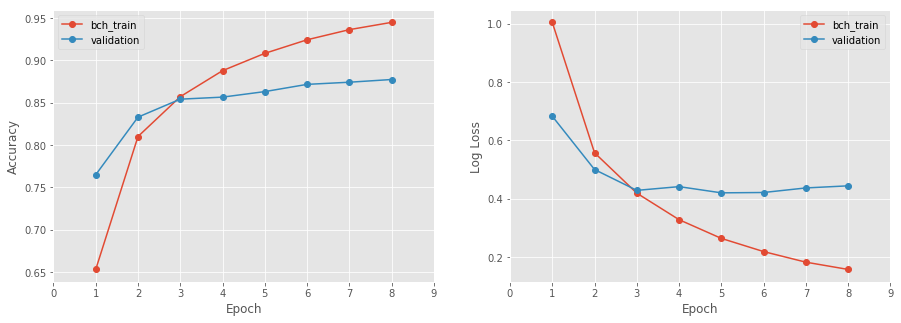

In [19]:
plt.style.use('ggplot')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

ax1.plot(np.arange(epochs)+1, metricRecords.accs, '-o', label='bch_train')
ax1.plot(np.arange(epochs)+1, metricRecords.val_accs, '-o', label='validation')
ax1.set_xlim(0, epochs+1)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend(loc='best')

ax2.plot(np.arange(epochs)+1, metricRecords.losses, '-o', label='bch_train')
ax2.plot(np.arange(epochs)+1, metricRecords.val_losses, '-o', label='validation')
ax2.set_xlim(0, epochs+1)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Log Loss')
ax2.legend(loc='best')

plt.show()

In [20]:
K.set_value(conv.optimizer.lr, 1e-4)

In [21]:
conv.fit_generator(batches, batches.n, nb_epoch=2, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/2
169936/170000 [============================>.] - ETA: 0s - loss: 0.0721 - acc: 0.9753  

In [22]:
K.set_value(conv.optimizer.lr, 1e-5)

In [23]:
conv.fit_generator(batches, batches.n, nb_epoch=2, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/2
169936/170000 [============================>.] - ETA: 0s - loss: 0.0309 - acc: 0.9898  

In [24]:
conv.load_weights(model_path+'cnn_10l_all-bn.h5')
conv.fit_generator(batches, batches.n, nb_epoch=2, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/2
169872/170000 [============================>.] - ETA: 0s - loss: 0.0278 - acc: 0.9907  

### Get neurons doubled

In [43]:
batch_size=64
gen = image.ImageDataGenerator()
batches = gen.flow(X_train, y_train, batch_size=batch_size)
val_batches = gen.flow(X_val, y_val, batch_size=batch_size)

In [32]:
import keras.callbacks as kcb
class CallMetric(kcb.Callback):
    def on_train_begin(self, logs={}):
        self.best_acc = 0.0
        self.accs = []
        self.val_accs = []
        self.losses = []
        self.val_losses = []
    def on_epoch_end(self, batch, logs={}):
        self.accs.append(logs.get('acc'))
        self.val_accs.append(logs.get('val_acc'))
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        if logs.get('val_acc') > self.best_acc:
            self.best_acc = logs.get('val_acc')
            print("\nThe BEST val_acc to date.")

In [40]:
def get_model_doub_bn():
    model = Sequential([
        Lambda(norm_input, input_shape=(3,30,30), output_shape=(3,30,30)),
        Convolution2D(64,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(64,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        BatchNormalization(axis=1),
        Convolution2D(128,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(128,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        BatchNormalization(axis=1),
        Convolution2D(256,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(256,3,3, activation='relu', border_mode='same'),
        BatchNormalization(axis=1),
        Convolution2D(256,3,3, activation='relu', border_mode='same'),
        MaxPooling2D(),
        Flatten(),
        BatchNormalization(),
        Dense(1024, init='he_normal'),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.5),
        Dense(1024, init='he_normal'),
        BatchNormalization(),
        Activation('relu'),
        Dropout(0.5),
        Dense(10, activation='softmax')
        ])
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [41]:
conv = get_model_doub_bn()

In [42]:
epochs = 3
metricRecords = CallMetric()
checkpointer = kcb.ModelCheckpoint(filepath=model_path+"cnn_10l_doub_all-bn.h5", monitor='val_acc', verbose=1, save_best_only=True)
conv.fit_generator(batches, batches.n, nb_epoch=epochs, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/3
169936/170000 [============================>.] - ETA: 0s - loss: 0.9528 - acc: 0.6724  

In [44]:
K.set_value(conv.optimizer.lr, 1e-5)
conv.fit_generator(batches, batches.n, nb_epoch=1, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/1
169936/170000 [============================>.] - ETA: 0s - loss: 0.1803 - acc: 0.9394  

In [45]:
K.set_value(conv.optimizer.lr, 1e-6)
conv.fit_generator(batches, batches.n, nb_epoch=1, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/1
169936/170000 [============================>.] - ETA: 0s - loss: 0.1495 - acc: 0.9501  

## Fintune the models

In [16]:
import keras.callbacks as kcb
class CallMetric(kcb.Callback):
    def on_train_begin(self, logs={}):
        self.best_acc = 0.0
        self.accs = []
        self.val_accs = []
        self.losses = []
        self.val_losses = []
    def on_epoch_end(self, batch, logs={}):
        self.accs.append(logs.get('acc'))
        self.val_accs.append(logs.get('val_acc'))
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        if logs.get('val_acc') > self.best_acc:
            self.best_acc = logs.get('val_acc')
            print("\nThe BEST val_acc to date.")

In [91]:
metricRecords = CallMetric()
checkpointer = kcb.ModelCheckpoint(filepath=model_path+"cnn_10l.h5", monitor='val_acc', verbose=1, save_best_only=True)
conv = get_model_bn()

In [84]:
conv.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_7 (Lambda)                (None, 3, 30, 30)     0           lambda_input_2[0][0]             
____________________________________________________________________________________________________
convolution2d_117 (Convolution2D (None, 32, 30, 30)    896         lambda_7[0][0]                   
____________________________________________________________________________________________________
batchnormalization_119 (BatchNor (None, 32, 30, 30)    128         convolution2d_117[0][0]          
____________________________________________________________________________________________________
convolution2d_118 (Convolution2D (None, 32, 30, 30)    9248        batchnormalization_119[0][0]     
___________________________________________________________________________________________

In [92]:
conv.fit_generator(batches, batches.n, nb_epoch=3, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

INFO (theano.gof.compilelock): Refreshing lock /root/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.13-64/lock_dir/lock


Epoch 1/3
199872/200000 [============================>.] - ETA: 0s - loss: 0.9566 - acc: 0.6698  

In [93]:
K.set_value(conv.optimizer.lr, 1e-4)
conv.fit_generator(batches, batches.n, nb_epoch=1, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/1
199936/200000 [============================>.] - ETA: 0s - loss: 0.2063 - acc: 0.9288  

In [97]:
conv.load_weights(model_path+"cnn_10l.h5")
K.set_value(conv.optimizer.lr, 1e-5)
conv.fit_generator(batches, batches.n, nb_epoch=3, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/3
199872/200000 [============================>.] - ETA: 0s - loss: 0.1484 - acc: 0.9498  

In [98]:
gen = image.ImageDataGenerator(rotation_range=8, width_shift_range=0.033, shear_range=0.3,
                               height_shift_range=0.033, zoom_range=0.08)
batches = gen.flow(X_train, y_train, batch_size=64)

In [99]:
conv.load_weights(model_path+'cnn_10l.h5')
K.set_value(conv.optimizer.lr, 1e-4)
conv.fit_generator(batches, batches.n, nb_epoch=8, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/8
199936/200000 [============================>.] - ETA: 0s - loss: 0.3875 - acc: 0.8678  

In [100]:
K.set_value(conv.optimizer.lr, 1e-5)
conv.fit_generator(batches, batches.n, nb_epoch=2, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/2
199872/200000 [============================>.] - ETA: 0s - loss: 0.2408 - acc: 0.9156  

In [102]:
conv.evaluate_generator(val_batches, val_batches.n)

[0.31455771789550779, 0.89570000000000005]

The accuracy in Kaggle competition dataset is <b>0.8844</b>

## Ensembling

In [103]:
X_test, y_test = test_dict['data'], y_val

In [106]:
# Validating data augmentation: cropping, horizontal reflection
X_tt_expand = np.zeros((4*X_test.shape[0], nChannel*(img_size-2)**2), dtype='float32')
y_tt_expand = np.zeros((4*y_test.shape[0], y_test.shape[1]), dtype='int8')
i, j = 0, 0
for x, y in zip(X_test, y_test):
    im = np.reshape(x, (-1, img_size, img_size))
    j += 1
    if j % 1000 == 0: print "Expanding image number", j
    # iterate over data telling us the details of how to
    # do the displacement
    for d1, d2 in [(0, 0), (2, 2)]:  # [(0, 0), (0, 2), (2, 0), (2, 2)]
        new_im = im[:, d1:(d1+img_size-2), d2:(d2+img_size-2)]
        X_tt_expand[i], y_tt_expand[i] = new_im.reshape(np.prod(new_im.shape)), y
        i += 1
        new_im_refl = new_im[:, :, ::-1]
        X_tt_expand[i], y_tt_expand[i] = new_im_refl.reshape(np.prod(new_im_refl.shape)), y
        i += 1

Expanding image number 1000
Expanding image number 2000
Expanding image number 3000
Expanding image number 4000
Expanding image number 5000
Expanding image number 6000
Expanding image number 7000
Expanding image number 8000
Expanding image number 9000
Expanding image number 10000


In [110]:
X_test = X_tt_expand.reshape(-1, nChannel, 30, 30)
y_test = y_tt_expand
del X_tt_expand, y_tt_expand

In [112]:
X, y = np.concatenate([X_train, X_test]), np.concatenate([y_train, y_test])

In [119]:
def fit_model(idx):
    model = get_model_bn()
    model.load_weights(model_path+'cnn_10l.h5')
    
    gen = image.ImageDataGenerator()
    batches = gen.flow(X[-40000:], y[-40000:], batch_size=64)
    K.set_value(model.optimizer.lr, 1e-5)
    model.fit_generator(batches, batches.n, nb_epoch=3, verbose=2)
    
    gen_aug = image.ImageDataGenerator(rotation_range=8, width_shift_range=0.033, shear_range=0.3,
                               height_shift_range=0.033, zoom_range=0.08)
    batches_aug = gen_aug.flow(X, y, batch_size=64)
    K.set_value(model.optimizer.lr, 1e-5)
    model.fit_generator(batches_aug, batches_aug.n, nb_epoch=1, verbose=2)
    
    model.save_weights(model_path+'model_'+str(idx)+'.h5')
    
    return model

In [120]:
models = [fit_model(i+1) for i in range(6)]

Epoch 1/3
25s - loss: 0.3604 - acc: 0.8835
Epoch 2/3
24s - loss: 0.3416 - acc: 0.8851
Epoch 3/3
24s - loss: 0.3271 - acc: 0.8895
Epoch 1/1
151s - loss: 0.2782 - acc: 0.9047
Epoch 1/3
25s - loss: 0.3633 - acc: 0.8805
Epoch 2/3
24s - loss: 0.3430 - acc: 0.8865
Epoch 3/3
25s - loss: 0.3293 - acc: 0.8898
Epoch 1/1
154s - loss: 0.2774 - acc: 0.9044
Epoch 1/3
25s - loss: 0.3664 - acc: 0.8827
Epoch 2/3
24s - loss: 0.3462 - acc: 0.8847
Epoch 3/3
24s - loss: 0.3324 - acc: 0.8897
Epoch 1/1
151s - loss: 0.2763 - acc: 0.9045
Epoch 1/3
24s - loss: 0.3658 - acc: 0.8811
Epoch 2/3
25s - loss: 0.3439 - acc: 0.8867
Epoch 3/3
25s - loss: 0.3285 - acc: 0.8894
Epoch 1/1
153s - loss: 0.2775 - acc: 0.9048
Epoch 1/3
25s - loss: 0.3624 - acc: 0.8808
Epoch 2/3
24s - loss: 0.3421 - acc: 0.8852
Epoch 3/3
24s - loss: 0.3260 - acc: 0.8882
Epoch 1/1
150s - loss: 0.2796 - acc: 0.9040
Epoch 1/3
24s - loss: 0.3649 - acc: 0.8801
Epoch 2/3
24s - loss: 0.3452 - acc: 0.8854
Epoch 3/3
25s - loss: 0.3284 - acc: 0.8893
Epoch 

In [17]:
all_preds = np.stack([m.predict(X_test, batch_size=256) for m in models])

In [18]:
avg_preds = all_preds.mean(axis=0)

In [20]:
avg_preds.shape

(10000, 10)

In [19]:
pred_test = np.argmax(avg_preds, 1)

The accuracy from ensembling in Kaggle competition dataset is <b>0.8942</b>

## Inception net

In [19]:
import keras.callbacks as kcb
class CallMetric(kcb.Callback):
    def on_train_begin(self, logs={}):
        self.best_acc = 0.0
        self.accs = []
        self.val_accs = []
        self.losses = []
        self.val_losses = []
    def on_epoch_end(self, batch, logs={}):
        self.accs.append(logs.get('acc'))
        self.val_accs.append(logs.get('val_acc'))
        self.losses.append(logs.get('loss'))
        self.val_losses.append(logs.get('val_loss'))
        if logs.get('val_acc') > self.best_acc:
            self.best_acc = logs.get('val_acc')
            print("\nThe BEST val_acc to date.")

In [20]:
from keras.layers.pooling import GlobalAveragePooling2D

In [29]:
def Conv2d_bn(x,
              nb_filter,
              nb_row,
              nb_col,
              border_mode='same',
              subsample=(1,1)):
    """Utility function to apply conv + BN.
    # Arguments
        x: input tensor.
        num_filters: number of filters in `Convolution2D`.
        num_row: height of the convolution kernel.
        num_col: width of the convolution kernel.
        border_mode: padding mode in `Convolution2D`.
        name: name of the ops; will become `name + '_conv'`
            for the convolution and `name + '_bn'` for the
            batch norm layer.
    # Returns
        Output tensor after applying `Convolution2D` and `BatchNormalization`.
    """
    x = Convolution2D(
        nb_filter, nb_row, nb_col,
        border_mode=border_mode,
        subsample=subsample, 
        bias=False)(x)
    x = Activation('relu')(x)
    x = BatchNormalization(axis=1)(x)
    return x

In [38]:
def incep_block_1(x):
    branch1x1 = Conv2d_bn(x, 48, 1, 1)
    
    branch3x3 = Conv2d_bn(x, 32, 1, 1)
    branch3x3 = Conv2d_bn(branch3x3, 48, 3, 3)
    
    branch5x5 = Conv2d_bn(x, 32, 1, 1)
    branch5x5 = Conv2d_bn(branch5x5, 48, 3, 3)
    branch5x5 = Conv2d_bn(branch5x5, 48, 3, 3)
    
    branch_pool = AveragePooling2D((2, 2), strides=(1, 1), border_mode='same')(x)
    branch_pool = Conv2d_bn(branch_pool, 48, 1, 1)
    
    x = merge([branch1x1, branch3x3, branch5x5, branch_pool],
             mode="concat", concat_axis=1)
    
    return x

In [39]:
def incep_block_2(x):
    branch1x1 = Conv2d_bn(x, 64, 1, 1)
    
    branch3x3 = Conv2d_bn(x, 32, 1, 1)
    branch3x3 = Conv2d_bn(branch3x3, 64, 3, 3)
    
    branch5x5 = Conv2d_bn(x, 32, 1, 1)
    branch5x5 = Conv2d_bn(branch5x5, 48, 3, 3)
    branch5x5 = Conv2d_bn(branch5x5, 64, 3, 3)
    
    branch_pool = AveragePooling2D((2, 2), strides=(1, 1), border_mode='same')(x)
    branch_pool = Conv2d_bn(branch_pool, 64, 1, 1)
    
    x = merge([branch1x1, branch3x3, branch5x5, branch_pool],
             mode="concat", concat_axis=1)
    
    return x

In [40]:
def incep_model():
    img_input = Input(shape=(3,30,30))
    x = Lambda(norm_input, output_shape=(3,30,30))(img_input)
    x = Conv2d_bn(x, 32, 3, 3)
    x = Conv2d_bn(x, 32, 1, 1)
    x = Conv2d_bn(x, 32, 3, 3)
    x = Convolution2D(96, 1, 1, activation='relu', border_mode='same')(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = BatchNormalization(axis=1)(x)
    x = incep_block_1(x)
    x = incep_block_2(x)
    x = Dropout(0.75)(x)
    x = GlobalAveragePooling2D()(x)
    #x = Flatten()(x)
    #x = Dense(1024)(x)
    #x = BatchNormalization()(x)
    #x = Activation('relu')(x)
    #x = Dropout(0.5)(x)
    #x = Dense(1024)(x)
    #x = BatchNormalization()(x)
    #x = Activation('relu')(x)
    #x = Dropout(0.5)(x)
    x = Dense(10, activation='softmax')(x)
    model = Model(img_input, x)
    model.compile(Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [41]:
metricRecords = CallMetric()
checkpointer = kcb.ModelCheckpoint(filepath=model_path+"incep_8l.h5", monitor='val_acc', verbose=1, save_best_only=True)
conv = incep_model()

In [42]:
conv.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_5 (InputLayer)             (None, 3, 30, 30)     0                                            
____________________________________________________________________________________________________
lambda_5 (Lambda)                (None, 3, 30, 30)     0           input_5[0][0]                    
____________________________________________________________________________________________________
convolution2d_88 (Convolution2D) (None, 32, 30, 30)    864         lambda_5[0][0]                   
____________________________________________________________________________________________________
activation_82 (Activation)       (None, 32, 30, 30)    0           convolution2d_88[0][0]           
___________________________________________________________________________________________

In [37]:
epochs = 3
conv.fit_generator(batches, batches.n, nb_epoch=epochs, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/3
199936/200000 [============================>.] - ETA: 0s - loss: 0.8898 - acc: 0.6844  

In [43]:
epochs = 3
conv.fit_generator(batches, batches.n, nb_epoch=epochs, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/3
199936/200000 [============================>.] - ETA: 0s - loss: 0.9244 - acc: 0.6727  

In [92]:
conv.fit_generator(batches, batches.n, nb_epoch=3, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

INFO (theano.gof.compilelock): Refreshing lock /root/.theano/compiledir_Linux-4.4--generic-x86_64-with-debian-stretch-sid-x86_64-2.7.13-64/lock_dir/lock


Epoch 1/3
199872/200000 [============================>.] - ETA: 0s - loss: 0.9566 - acc: 0.6698  

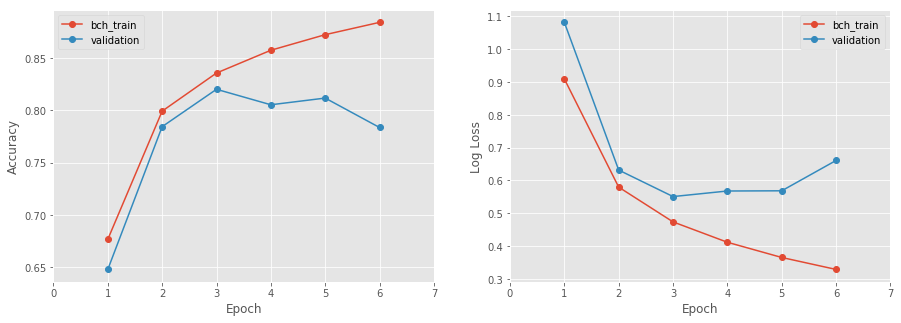

In [22]:
plt.style.use('ggplot')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

ax1.plot(np.arange(epochs)+1, metricRecords.accs, '-o', label='bch_train')
ax1.plot(np.arange(epochs)+1, metricRecords.val_accs, '-o', label='validation')
ax1.set_xlim(0, epochs+1)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend(loc='best')

ax2.plot(np.arange(epochs)+1, metricRecords.losses, '-o', label='bch_train')
ax2.plot(np.arange(epochs)+1, metricRecords.val_losses, '-o', label='validation')
ax2.set_xlim(0, epochs+1)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Log Loss')
ax2.legend(loc='best')

plt.show()

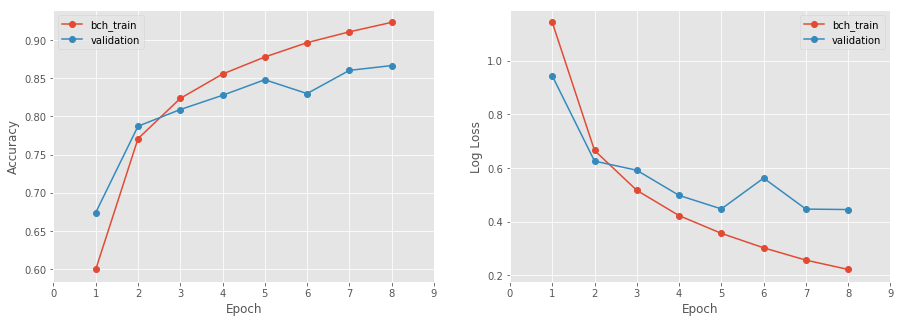

In [19]:
plt.style.use('ggplot')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))

ax1.plot(np.arange(epochs)+1, metricRecords.accs, '-o', label='bch_train')
ax1.plot(np.arange(epochs)+1, metricRecords.val_accs, '-o', label='validation')
ax1.set_xlim(0, epochs+1)
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Accuracy')
ax1.legend(loc='best')

ax2.plot(np.arange(epochs)+1, metricRecords.losses, '-o', label='bch_train')
ax2.plot(np.arange(epochs)+1, metricRecords.val_losses, '-o', label='validation')
ax2.set_xlim(0, epochs+1)
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Log Loss')
ax2.legend(loc='best')

plt.show()

In [19]:
K.set_value(conv.optimizer.lr, 1e-4)
conv.fit_generator(batches, batches.n, nb_epoch=1, 
                    validation_data=val_batches, nb_val_samples=val_batches.n, 
                    callbacks=[metricRecords, checkpointer])

Epoch 1/1
339872/340000 [============================>.] - ETA: 0s - loss: 0.3027 - acc: 0.8965  